# TACO Object Detection with Yolo v5 (by ultralytics)

## Get dataset

In [1]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 396, done.
remote: Counting objects: 100% (126/126), done.
remote: Compressing objects: 100% (85/85), done.
remote: Total 396 (delta 90), reused 74 (delta 41), pack-reused 270
Receiving objects: 100% (396/396), 63.95 MiB | 16.62 MiB/s, done.
Resolving deltas: 100% (241/241), done.


In [1]:
%cd TACO

/home/ubuntu/trash-team/TACO


### Download images

In [3]:
!python3 download.py

Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished [=============================.] - 1499/1500


## Imports

In [2]:
import torch
from IPython.display import Image  # for displaying images
import os 
import random
import shutil
from sklearn.model_selection import train_test_split
import xml.etree.ElementTree as ET
from xml.dom import minidom
# from tqdm import tqdm
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import json

random.seed(108)

## Data viz

In [3]:
anns_file_path = 'data/annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


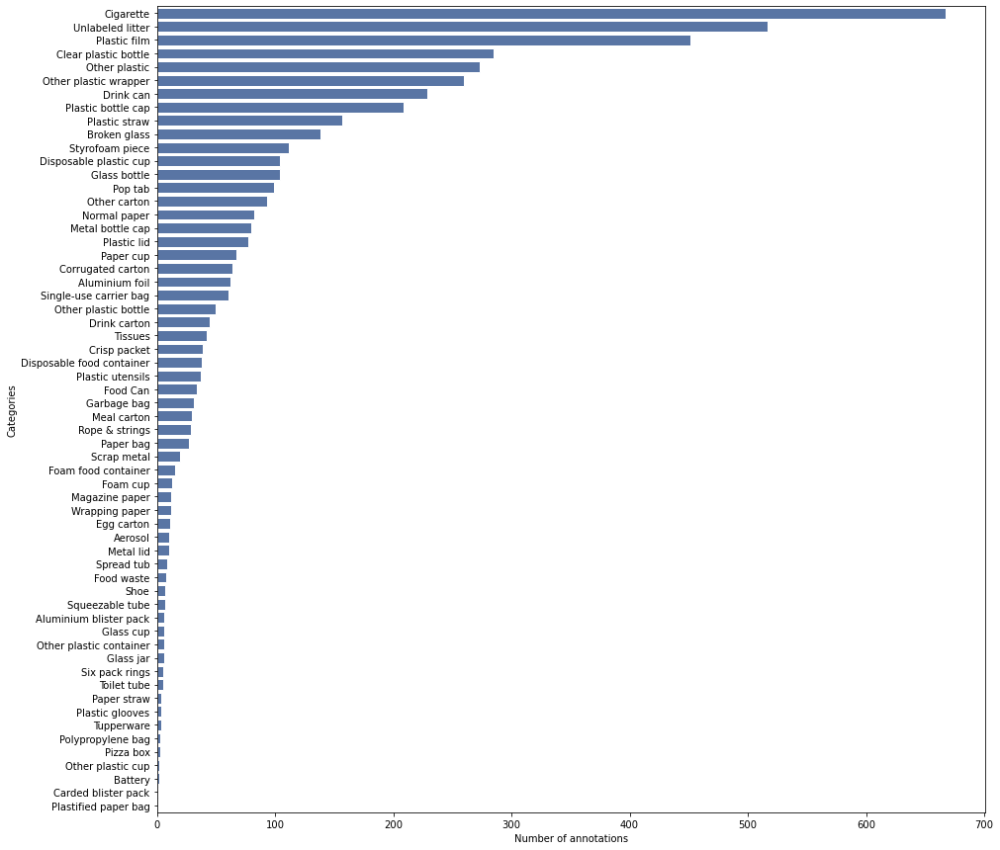

In [4]:
# Count annotations
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(15,15))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
sns.set_color_codes("pastel")
sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df,
            label="Total", color="b")

# fig = plot_1.get_figure()
# fig.savefig("categories-plot.png")

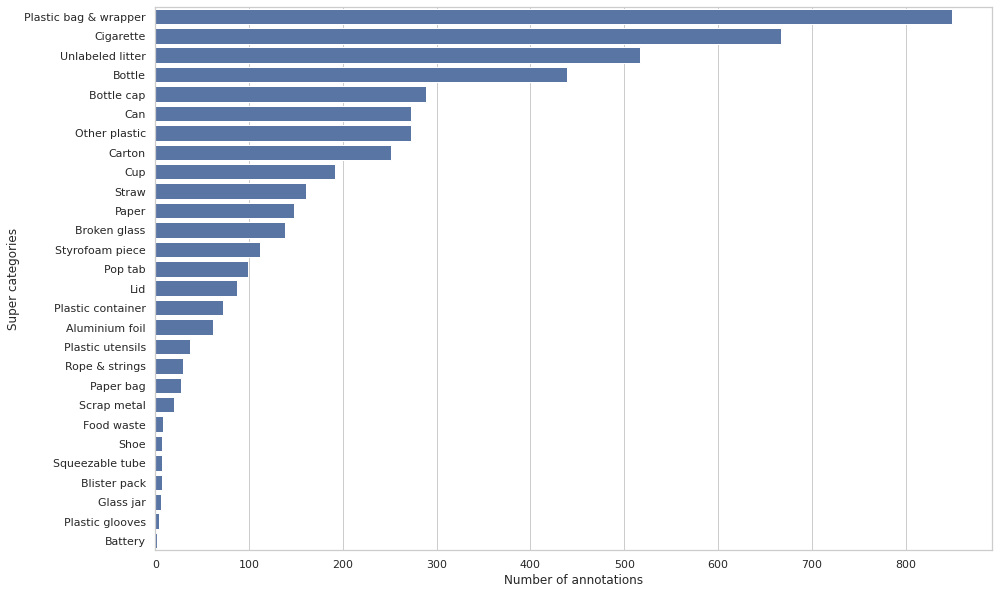

In [5]:
cat_ids_2_supercat_ids = {}
for cat in categories:
    cat_ids_2_supercat_ids[cat['id']] = super_cat_ids[cat['supercategory']]

# Count annotations
super_cat_histogram = np.zeros(nr_super_cats,dtype=int)
for ann in anns:
    cat_id = ann['category_id']
    super_cat_histogram[cat_ids_2_supercat_ids[cat_id]] +=1
    
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(15,10))

# Convert to DataFrame
d ={'Super categories': super_cat_names, 'Number of annotations': super_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values('Number of annotations', 0, False)

sns.set_color_codes("pastel")
sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total", color="b")
# plot_1.set_title('Annotations per super category',fontsize=20)

## Create a list with supercategories

In [6]:
# TODO: Bundle classes and update the labels with the new classes
cats = [o['supercategory'] for o in dataset['categories']]
ordered_supercats = list(set(cats))
print(ordered_supercats)
print(f'Index of Carton: {ordered_supercats.index("Carton")}')

['Other plastic', 'Scrap metal', 'Cigarette', 'Lid', 'Food waste', 'Aluminium foil', 'Squeezable tube', 'Pop tab', 'Carton', 'Shoe', 'Glass jar', 'Paper', 'Plastic utensils', 'Broken glass', 'Cup', 'Bottle', 'Plastic container', 'Battery', 'Blister pack', 'Plastic glooves', 'Paper bag', 'Styrofoam piece', 'Can', 'Rope & strings', 'Straw', 'Plastic bag & wrapper', 'Bottle cap', 'Unlabeled litter']
Index of Carton: 8


## Convert annotations to Yolov5 format 

In [7]:
!pwd

/home/ubuntu/trash-team/TACO


In [8]:
# make the required directories in TACO
!mkdir labels images

The *.txt file specifications are:

* One row per object
* Each row is class x_center y_center width height format.
* Box coordinates must be in normalized xywh format (from 0 - 1). If your boxes are in pixels, divide x_center and width by image width, and y_center and height by image height.
* Class numbers are zero-indexed (start from 0).

### The COCO format
The bounding boxes in COCO are (x-top left, y-top left, width, height)

So we'll have to convert from x_top to x_center and same for y.

We can do this by adding half the width/height to the x an y

In [9]:
batch_anns = 'data/annotations.json'

with open(batch_anns, 'r') as f:
    dataset_batch = json.loads(f.read())

for o in dataset_batch['annotations']:
    fname = dataset_batch['images'][o['image_id']]['file_name']
    fname = fname[:-3] + 'txt'
    fname = fname.replace('atch_', '').replace('/', '_')
    image_w = dataset_batch['images'][o['image_id']]['width']
    image_h = dataset_batch['images'][o['image_id']]['height']
    # Grab bbox info 
    bbox = o['bbox']
    top_x, top_y, width, height = bbox
    # Change x and y from topleft to center
    center_x = top_x + (width/2)
    center_y = top_y + (height/2)
    # Normalize bbox values
    center_x /= image_w
    center_y /= image_h
    width /= image_w
    height /= image_h

    # Grab the category or supercategory, comment out whichever you don't want. Make sure to update the yaml config file to reflect the correct list of classes
    #cat_idx = o['category_id']

    supercat_name = dataset_batch['categories'][o['category_id']]['supercategory']
    cat_idx = ordered_supercats.index(supercat_name)

    # Put category and 4 bbox values on one line for Yolov5 compatibility
    bbox_line = '{} {} {} {} {}\n'.format(cat_idx, center_x, center_y, width, height)
    #     print(bbox_line)

    # Write the annotation files
    f = open(f'labels/{fname}', 'a')
    f.write(bbox_line)
    f.close()

In [11]:
!cat labels/b1_000108.txt

23 0.47487745098039214 0.6266850490196079 0.2790032679738562 0.22212009803921567
2 0.5465686274509803 0.4810049019607843 0.03431372549019608 0.03553921568627451


### Rename and move images to use same structure as defined before

In [12]:
batch_id = 1
while batch_id < 16:
  batchdir = os.listdir(f'data/batch_{batch_id}')
  [shutil.move(f'data/batch_{batch_id}/{o}', f'images/b{batch_id}_{o}') for o in batchdir if o[-3:].lower() == 'jpg']
  batch_id += 1

### Split into train/val/test

In [13]:
# Read images and annotations
images = [os.path.join('images', x) for x in os.listdir('images')]
annotations = [os.path.join('labels', x) for x in os.listdir('labels') if x[-3:] == "txt"]

images.sort()
annotations.sort()

# Split the dataset into train-valid-test splits 
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.2, random_state = 1)
val_images, test_images, val_annotations, test_annotations = train_test_split(val_images, val_annotations, test_size = 0.5, random_state = 1)

In [14]:
len(train_images), len(val_images), len(test_images)

(1200, 150, 150)

In [15]:
!mkdir images/train images/val images/test labels/train labels/val labels/test

In [16]:
#Utility function to move images 
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

# Move the splits into their folders
move_files_to_folder(train_images, 'images/train')
move_files_to_folder(val_images, 'images/val/')
move_files_to_folder(test_images, 'images/test/')
move_files_to_folder(train_annotations, 'labels/train/')
move_files_to_folder(val_annotations, 'labels/val/')
move_files_to_folder(test_annotations, 'labels/test/')

## Show examples per class

In [24]:
train_imgs = [os.path.join('images/train', x) for x in os.listdir('images/train')]

In [29]:
import re


images/train/b2_000060.JPG
labels/train/b2_000060.txt


Plastic bag & wrapper
Unlabeled litter


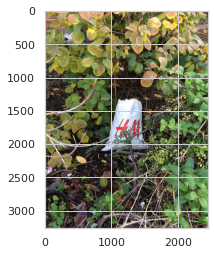

In [30]:
# TODO: use exif info to rotate the images when needed. The TACO docs talk about maybe using cv2 instead to make sure the images are upright.
# TODO: Combine this with the show_examples() function?

import re

# Use this line if using the normal cats
# class_id_to_name_mapping = {o['id']:o['name'] for o in dataset['categories']}
# Use below line if using supercats
class_id_to_name_mapping = ordered_supercats

def plot_bounding_box(image, annotation_list):
    annotations = np.array(annotation_list)
    w, h = image.size
    
    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h 
    
    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]
    
    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        
        ann_class = class_id_to_name_mapping[(int(obj_cls))]
        print(ann_class)
        
        plotted_image.rectangle(((x0,y0), (x1,y1)))
        plotted_image.text((x0, y0 - 10), ann_class, )
    
    plt.imshow(np.array(image))
    plt.show()

# Get any random image from the train set
image_file = random.choice(train_imgs)
assert os.path.exists(image_file)

#Get the corresponding image file
annotation_file = image_file.replace("images", "labels")
annotation_file = re.sub('jpg', 'txt', annotation_file, flags=re.IGNORECASE)

with open(annotation_file, "r") as file:
    annotation_list = file.read().split("\n")[:-1]
    annotation_list = [x.split(" ") for x in annotation_list]
    annotation_list = [[float(y) for y in x ] for x in annotation_list]

#Load the image
image = Image.open(image_file)

#Plot the Bounding Box
plot_bounding_box(image, annotation_list)

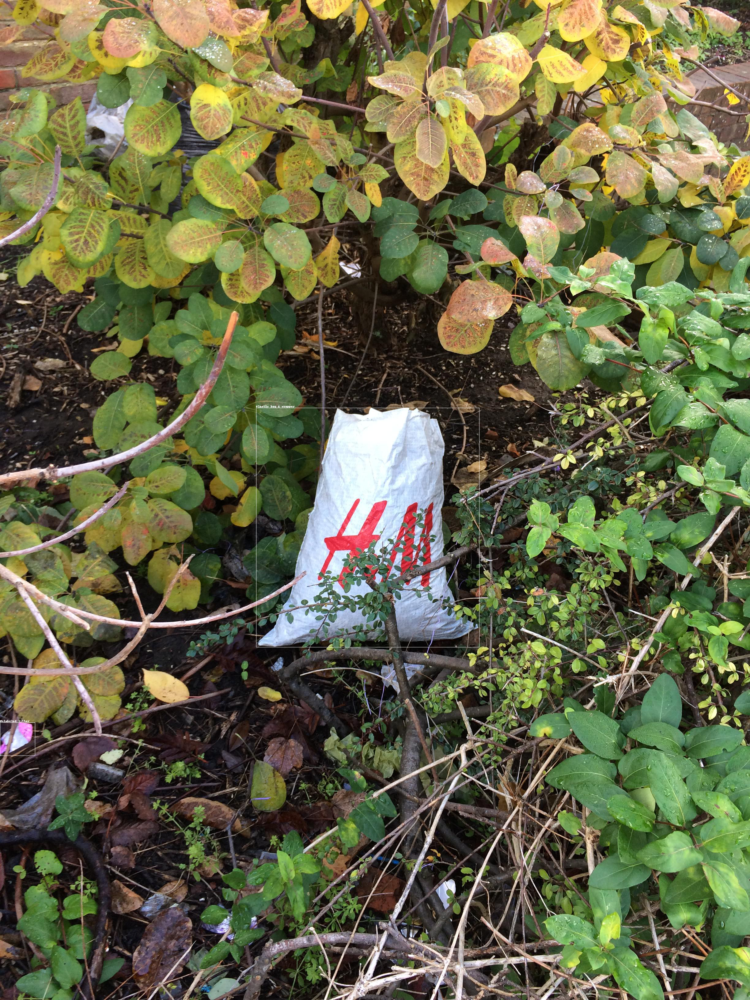

In [32]:
image

In [ ]:
# THIS NEEDS REWRITING, the idea is to grab certain pics based on specified (super)category
# def show_examples(category_name, super=False):
#     # TODO: Haven't tested the supercategories yet here
#     if super:
#         category_ids = [o['id'] for o in dataset['categories'] if o['supercategory'] == category_name]
#         print(f'Super Category IDS: {category_ids}')
#     else:
#         category_info = [(o['id'], o['supercategory']) for o in dataset['categories'] if o['name'] == category_name]
#         category_ids, super_category = [category_info[0][0]], category_info[0][1]
#         print(f'Category ID: {category_ids}, Super Category: {super_category}')
    
#     image_ids = [o['image_id'] for o in dataset['annotations'] if o['category_id'] in category_ids]
    
#     image_id = random.choice(image_ids)
#     print(f'Image ID: {image_id}')
    
#     images = [o['file_name'] for o in dataset['images'] if o['id'] == image_id]
    
#     # Have to match the new filenames as I've put everything in one folder. See some later cells.
#     fname = images[0].replace('atch_', '').replace('/', '_')
    
#     #TODO: Clean this up, might also restrict it to only show images if they are in training set.
#     try:
#         im_path = f'images/{fname}'
#     except:
#         im_path = f'images/{fname}'
        
#     print(im_path)
#     return Image.open(im_path)
    
# show_examples('Aluminium foil', False)

## Train the Model

### Download Yolov5

In [35]:
%cd ..

/home/ubuntu/trash-team


In [36]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 7328, done.
remote: Counting objects: 100% (450/450), done.
remote: Compressing objects: 100% (294/294), done.
remote: Total 7328 (delta 281), reused 280 (delta 156), pack-reused 6878
Receiving objects: 100% (7328/7328), 9.19 MiB | 5.70 MiB/s, done.
Resolving deltas: 100% (5006/5006), done.


In [37]:
!pip install -r yolov5/requirements.txt

     |████████████████████████████████| 51.0 MB 20.0 MB/s eta 0:00:01
     |████████████████████████████████| 662 kB 70.5 MB/s eta 0:00:01
     |████████████████████████████████| 75 kB 10.5 MB/s  eta 0:00:01
     |████████████████████████████████| 6.0 MB 104.7 MB/s eta 0:00:01
     |████████████████████████████████| 288 kB 105.1 MB/s eta 0:00:01
     |████████████████████████████████| 4.2 MB 109.0 MB/s eta 0:00:01
     |████████████████████████████████| 97 kB 12.9 MB/s  eta 0:00:01
     |████████████████████████████████| 4.9 MB 85.5 MB/s eta 0:00:01
     |████████████████████████████████| 781 kB 98.8 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 51.8 MB/s eta 0:00:01
     |████████████████████████████████| 147 kB 120.3 MB/s eta 0:00:01
     |████████████████████████████████| 132 kB 115.8 MB/s eta 0:00:01
     |████████████████████████████████| 155 kB 110.5 MB/s eta 0:00:01
     |████████████████████████████████| 77 kB 12.1 MB/s  eta 0:00:01
     |█████████████████████

### Create yaml file with instructions on where to find data and which/how many classes to use

In [38]:
import yaml

In [39]:
data = {'train': 'TACO/images/train/', 
        'val': 'TACO/images/val',
        'test': 'TACO/images/test/',
        'nc' : len(class_id_to_name_mapping),
        'names' : class_id_to_name_mapping}

with open('taco_yolo.yaml', 'w') as f:
    data = yaml.dump(data, f, sort_keys=False)

In [40]:
!cat taco_yolo.yaml

train: TACO/images/train/
val: TACO/images/val
test: TACO/images/test/
nc: 28
names:
- Other plastic
- Scrap metal
- Cigarette
- Lid
- Food waste
- Aluminium foil
- Squeezable tube
- Pop tab
- Carton
- Shoe
- Glass jar
- Paper
- Plastic utensils
- Broken glass
- Cup
- Bottle
- Plastic container
- Battery
- Blister pack
- Plastic glooves
- Paper bag
- Styrofoam piece
- Can
- Rope & strings
- Straw
- Plastic bag & wrapper
- Bottle cap
- Unlabeled litter


### Check for GPU

In [42]:
print(torch.cuda.is_available())

True


### Start training

In [ ]:
!python yolov5/train.py --img 640 --cfg yolov5m.yaml --hyp hyp.scratch.yaml --batch 32 --epochs 3 --data taco_yolo.yaml --weights yolov5m.pt --name yolo_taco_det

train: weights=yolov5m.pt, cfg=yolov5m.yaml, data=taco_yolo.yaml, hyp=hyp.scratch.yaml, epochs=3, batch_size=32, img_size=[640], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket=, cache_images=False, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolo_taco_det, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
requirements: /home/ubuntu/trash-team/requirements.txt not found, check failed.
YOLOv5 🚀 v5.0-231-g03281f8 torch 1.9.0+cu111 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=